# Озвучивание текста

Сегодня рассмотрим такую проблему, как перевод текстовой информации в голосовое сообщение.

**Для начала загрузи модель синтеза речи из файла `tts.zip` на платформу Kaggle, чтобы она была доступна на платформе:**

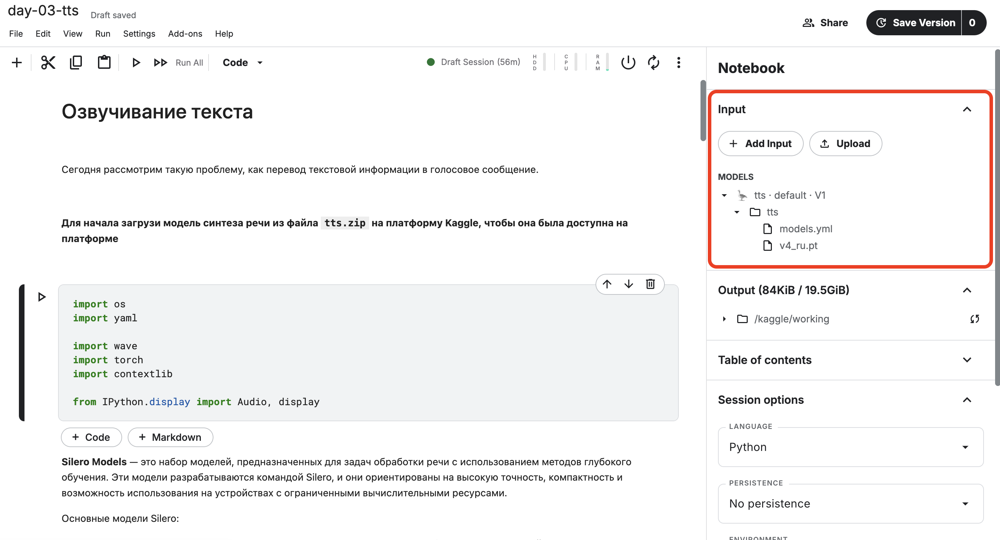

In [1]:
import os
import yaml

import wave
import torch
import contextlib

from IPython.display import Audio, display

**Silero Models** — это набор моделей, предназначенных для задач обработки речи с использованием методов глубокого обучения. Эти модели разрабатываются командой Silero, и они ориентированы на высокую точность, компактность и возможность использования на устройствах с ограниченными вычислительными ресурсами.

Основные модели Silero:
* Speech-to-Text (STT) — модели распознавания речи. Они позволяют преобразовывать аудиофайлы в текст. Модели поддерживают несколько языков, включая английский и русский, и могут использоваться для построения голосовых помощников, транскрибирования аудио и других задач.

* Text-to-Speech (TTS) — модели синтеза речи. Эти модели преобразуют текст в речь и могут использоваться для создания голосовых интерфейсов или генерации аудиокниг.

* Voice Activity Detection (VAD) — модели для детектирования активных голосовых сегментов. Они помогают разделить аудиозаписи на фрагменты с речью и шумом, что полезно для предварительной обработки аудиоданных.

Для того, чтобы познакомится с моделям silero требуется загрузить файл `models.yml`

In [2]:
with open('/kaggle/input/tts/pytorch/default/1/tts/tts/models.yml') as stream:
    models = yaml.safe_load(stream)

## Модели silero

Посмотрим, какие языки поддерживаются этими моделями. Разные модели могут работать с определённым набором языков. Все зависит от данных, на которых училась каждая модель.

In [3]:
available_languages = list(models["tts_models"].keys())
print(f'Available languages {available_languages}')

Available languages ['ru', 'en', 'de', 'es', 'fr', 'ba', 'xal', 'tt', 'uz', 'ua', 'indic', 'cyrillic', 'multi']


Посмотрим на возможные модели для каждого из языков.

In [4]:
for lang in available_languages:
    _models = list(models["tts_models"].get(lang).keys())
    print(f'Модели для {lang}: {_models}')

Модели для ru: ['v4_ru', 'v3_1_ru', 'ru_v3', 'aidar_v2', 'aidar_8khz', 'aidar_16khz', 'baya_v2', 'baya_8khz', 'baya_16khz', 'irina_v2', 'irina_8khz', 'irina_16khz', 'kseniya_v2', 'kseniya_8khz', 'kseniya_16khz', 'natasha_v2', 'natasha_8khz', 'natasha_16khz', 'ruslan_v2', 'ruslan_8khz', 'ruslan_16khz']
Модели для en: ['v3_en', 'v3_en_indic', 'lj_v2', 'lj_8khz', 'lj_16khz']
Модели для de: ['v3_de', 'thorsten_v2', 'thorsten_8khz', 'thorsten_16khz']
Модели для es: ['v3_es', 'tux_v2', 'tux_8khz', 'tux_16khz']
Модели для fr: ['v3_fr', 'gilles_v2', 'gilles_8khz', 'gilles_16khz']
Модели для ba: ['aigul_v2']
Модели для xal: ['v3_xal', 'erdni_v2']
Модели для tt: ['v3_tt', 'dilyara_v2']
Модели для uz: ['v4_uz', 'v3_uz', 'dilnavoz_v2']
Модели для ua: ['v4_ua', 'v3_ua', 'mykyta_v2']
Модели для indic: ['v4_indic', 'v3_indic']
Модели для cyrillic: ['v4_cyrillic']
Модели для multi: ['multi_v2']


В данном случае нас интересует русский язык. Выведем модели, которые подходят для нашей задачи.

In [5]:
_models = list(models["tts_models"].get('ru').keys())
print(f'Модели для русского языка: {_models}')

Модели для русского языка: ['v4_ru', 'v3_1_ru', 'ru_v3', 'aidar_v2', 'aidar_8khz', 'aidar_16khz', 'baya_v2', 'baya_8khz', 'baya_16khz', 'irina_v2', 'irina_8khz', 'irina_16khz', 'kseniya_v2', 'kseniya_8khz', 'kseniya_16khz', 'natasha_v2', 'natasha_8khz', 'natasha_16khz', 'ruslan_v2', 'ruslan_8khz', 'ruslan_16khz']


## Загрузка модели

Выберем модель v4_ru. Работа на компьютере может осуществляться на CPU или на GPU (намного быстрее в случае работы с моделями машинного обучения). Для простоты укажем, что мы будем работать на CPU.

In [6]:
language = 'ru'
model_id = 'v4_ru'
sample_rate = 48000
device = torch.device('cpu')

Создадим модель с параметрами выше. В переменную example_text будет скачан базовый пример текста для тестирования.

In [7]:
model = torch.package.PackageImporter(
    "/kaggle/input/tts/pytorch/default/1/tts/tts/v4_ru.pt"
).load_pickle("tts_models", "model")
model.to(device)  # gpu or cpu

### Работа с моделью

Посмотрим, какими голосами может «говорить» наша модель.

In [8]:
model.speakers

['aidar', 'baya', 'kseniya', 'xenia', 'eugene', 'random']

### Text

Укажем скорость записи, выберем говорящего (в данном случае, это женский голос), а также необходимые параметры. Также возьмем небольшую скороговорку, как пример текста.

In [9]:
example_text = 'В недрах тундры выдры в гетрах тырят в вёдра ядра кедров.'

Теперь переведем этот текст в звук.

In [10]:
audio = model.apply_tts(
    text=example_text,
    speaker='aidar',
)
print(example_text)
display(Audio(audio, rate=sample_rate))

В недрах тундры выдры в гетрах тырят в вёдра ядра кедров.


Скорее всего, что-то режет слух. Неудивительно - наша модель ошиблась с ударением. Для этого мы можем выставить ударения в текста, прежде чем он будет преобразован в звук.

In [11]:
example_text = 'В недрах тундры выдры в гетрах тырят в +вёдра +ядра к+едров.'

In [12]:
audio = model.apply_tts(
    text=example_text,
    speaker='xenia',
)
print(example_text)
display(Audio(audio, rate=sample_rate))

В недрах тундры выдры в гетрах тырят в +вёдра +ядра к+едров.


Можно не только изменять ударение, но и очень значительно изменять манеру говорения: повышать или понижать тон, замедлять или ускорять темп, делать паузы. Изучи пример ниже.

In [13]:
ssml_sample = """
              <speak>
              <p>
                  Когда я просыпаюсь, <prosody rate="x-slow">я говорю довольно медленно</prosody>.
                  Потом я начинаю говорить своим обычным голосом,
                  <prosody pitch="x-high"> а могу говорить тоном выше </prosody>,
                  или <prosody pitch="x-low">наоборот, ниже</prosody>.
                  Потом, если повезет, <prosody rate="fast">я могу говорить и довольно быстро.</prosody>
                  А еще я умею делать паузы любой длины, например, две секунды <break time="2000ms"/>.
                  <p>
                    Также я умею делать паузы между параграфами.
                  </p>
                  <p>
                    <s>И также я умею делать паузы между предложениями.</s>
                    <s>Вот, например, как сейчас.</s>
                  </p>
              </p>
              </speak>
              """

audio = model.apply_tts(
    ssml_text=ssml_sample,
    speaker='xenia',
)
display(Audio(audio, rate=sample_rate))

## Задание 1

Сегодня тебе не нужно будет обучать новые модели. Твое задание заключается в следующем:

Составь небольшую речь, используя примеры выше, и преобразуй ее в звуковой файл.
1. Выбери подходящий голос для озвучивания.
2. Необходимо, чтобы все ударения были правильно проставлены.
3. Используй как можно больше модификаций голоса. Минимум 4 модификации (про них более подробно можешь прочитать [здесь](https://github.com/snakers4/silero-models/wiki/SSML)).
4. Сохрани получившийся аудио-файл.

*P.S. Если хочешь прикрепить аудиофайл к своему решению, его нужно преобразовать из формата .wav в .mp4. 
Это можно сделать через [онлайн конвертер](https://www.freeconvert.com/wav-to-mp4)*.

In [14]:
ssml_sample = """
              <speak>
              <p>
                  Краб крабу сделал грабли. Подал грабли крабу краб: грабь граблями гравий, краб! <prosody rate="x-slow">Тридцать три корабля лавировали, лавировали, лавировали, лавировали да не вылавировали.</prosody>.                  
                  <prosody pitch="x-high"> Два щенка щека к щеке щиплют щётку в уголке. </prosody>,
                  и еще <prosody pitch="x-low">Вы малину мыли ли? Мыли, но не мылили!</prosody>.
                  <p>
                  <prosody rate="fast">Скороговорун скороговорил скоровыговаривал, что всех скороговорок не перескороговоришь, не перевыскороговор+ишь, 
                  но, заск+ороговорившись, выск+ороговорил, что все скороговорки перескороговоришь, да не перевыскороговор+ишь. </prosody>
                  </p>
                  Карл клал лук на ларь. Клара крала лук с ларя. <break time="3000ms"/>.
                  <p>
                    Невелик бицепс у эксгибициониста.
                  </p>
                  <p>
                    <s>Терминатору термометр не требуется. У терминатора температура субфебрильная.</s>                    
                  </p>
              </p>
              </speak>
              """

audio = model.apply_tts(
    ssml_text=ssml_sample,
    speaker='baya',
)
display(Audio(audio, rate=sample_rate))

In [15]:
import soundfile as sf

# Сохранение аудиофайла
output_file = "my_audio.wav"
sf.write(output_file, audio, samplerate=sample_rate)